<a href="https://colab.research.google.com/github/sergioangarita/Ganaderia_De_Precision/blob/main/SergioYoloV8_Ganaderia_V2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# *Install the Ultralytics library*

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.4/709.4 kB 4.6 MB/s eta 0:00:00


# *Import Yolo model from ultralytics*

In [ ]:
from ultralytics import YOLO
import os
from IPython import display
display.clear_output()
!yolo mode=checks

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 509, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.10/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are ('train', 'val', 'predict', 'export', 'track', 'benchmark').

    Arguments received: ['yolo', 'mode=checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of ('detect', 'segment', 'classify', 'pose', 'obb')
                MODE (required) is one of ('train', 'val', 'predict', 'export', 'track', 'benchmark')
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at ht

# *Download the zip archive*

In [ ]:
!wget https://storage.googleapis.com/theos-development-static-v1/cowsV82.zip

--2024-01-31 19:34:48--  https://storage.googleapis.com/theos-development-static-v1/cowsV82.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 209.85.234.207, 142.251.171.207, 142.251.172.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|209.85.234.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7685710227 (7.2G) [application/zip]
Saving to: ‘cowsV82.zip’

cowsV82.zip         100%[===================>]   7.16G   120MB/s    in 71s     

2024-01-31 19:35:59 (103 MB/s) - ‘cowsV82.zip’ saved [7685710227/7685710227]



# *Unzip the file*

In [ ]:
!unzip cowsV82.zip -d cowsV82

Archive:  cowsV82.zip
   creating: cowsV82/cows2v8/
  inflating: cowsV82/cows2v8/configuration.yaml  
   creating: cowsV82/cows2v8/train/
   creating: cowsV82/cows2v8/train/images/
  inflating: cowsV82/cows2v8/train/images/15ea8b35-bdb4-49c0-bea8-380fd3113804.JPG  
  inflating: cowsV82/cows2v8/train/images/e473e165-ebd7-4b7e-8653-2cc120bdd072.JPG  
  inflating: cowsV82/cows2v8/train/images/048af31c-be85-4060-9b0f-d1a0ec467577.JPG  
  inflating: cowsV82/cows2v8/train/images/04cc41d1-de5c-4ee9-a07f-89c73aa8a0ed.JPG  
  inflating: cowsV82/cows2v8/train/images/b642c05c-a42f-4116-be6f-099dcdbb2fa6.JPG  
  inflating: cowsV82/cows2v8/train/images/63df0582-6333-4411-b0e4-a8c399b6c097.JPG  
  inflating: cowsV82/cows2v8/train/images/b352d759-76d1-4f81-9137-c830f6be61f2.JPG  
  inflating: cowsV82/cows2v8/train/images/92761b7e-9466-4e22-9857-fe75e125e942.JPG  
  inflating: cowsV82/cows2v8/train/images/45867f18-7208-4dd4-9a42-876a36517cd8.JPG  
  inflating: cowsV82/cows2v8/train/images/fbdc3f95-cfa

# *Train the model with the previous weights and the data provided*

In [ ]:
!yolo task=detect mode=train model=/content/best.pt data='/content/cowsV82/cows2v8/configuration.yaml' epochs=5 imgsz=640

Ultralytics YOLOv8.1.8 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/best.pt, data=/content/cowsV82/cows2v8/configuration.yaml, epochs=5, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, s

# *Display results*

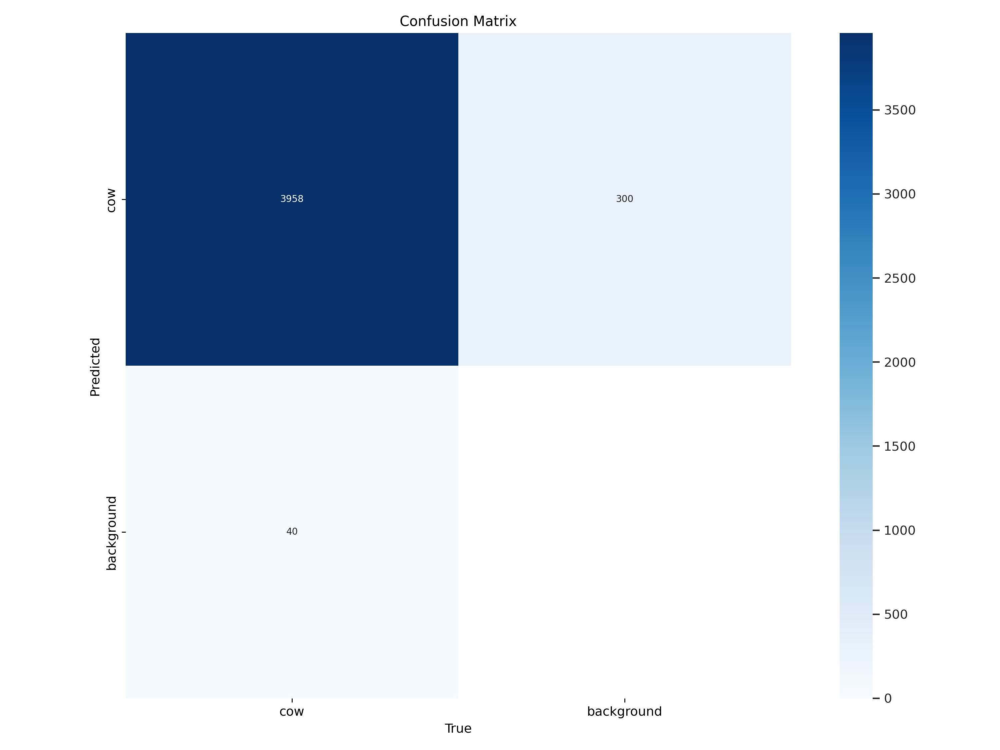

In [ ]:
import glob
from IPython.display import Image, display_html
Image(filename = f'/content/runs/detect/train/confusion_matrix.png', width=800)

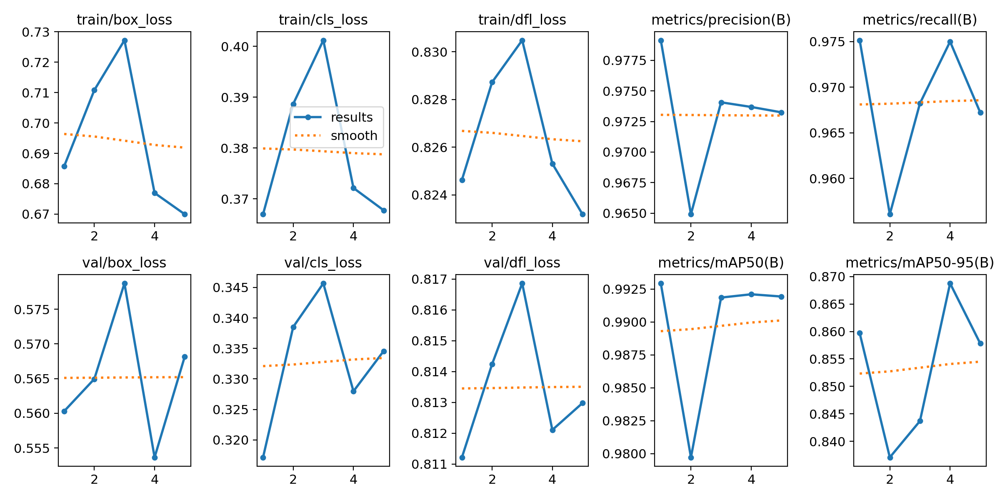

In [ ]:
Image(filename = f'/content/runs/detect/train/results.png', width=800)

# *Validation*

In [ ]:
!yolo task=detect mode=val model= /content/runs/detect/train/weights/best.pt data='/content/cowsV82/cows2v8/configuration.yaml'

Ultralytics YOLOv8.1.8 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/cowsV82/cows2v8/valid/labels.cache... 270 images, 32 backgrounds, 0 corrupt: 100% 302/302 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 19/19 [01:17<00:00,  4.09s/it]
                   all        302       3998      0.974      0.975      0.992      0.873
Speed: 1.0ms preprocess, 19.0ms inference, 0.0ms loss, 9.3ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


# *Test the Model*

In [ ]:
!yolo task=detect mode=predict model= /content/runs/detect/train/weights/best.pt conf=0.5 source='/content/cowsV82/cows2v8/test/images'

Ultralytics YOLOv8.1.8 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs

image 1/144 /content/cowsV82/cows2v8/test/images/050c461d-762a-4d53-8c1f-5985affefc71.JPG: 480x640 17 cows, 136.9ms
image 2/144 /content/cowsV82/cows2v8/test/images/0be4cfb5-d6bf-4677-8014-15c0cd172533.JPG: 480x640 (no detections), 28.2ms
image 3/144 /content/cowsV82/cows2v8/test/images/0bfaae43-5e9c-4424-a6b2-21cb6340f760.JPG: 480x640 2 cows, 28.1ms
image 4/144 /content/cowsV82/cows2v8/test/images/0d9646c3-a017-4164-9bec-82e56316d608.JPG: 480x640 3 cows, 28.1ms
image 5/144 /content/cowsV82/cows2v8/test/images/0e0d79d9-f891-46a4-99af-86008ffc1db4.JPG: 480x640 12 cows, 28.1ms
image 6/144 /content/cowsV82/cows2v8/test/images/0f7884e5-0bc7-4698-bb09-a0406daa33b7.JPG: 384x640 32 cows, 90.5ms
image 7/144 /content/cowsV82/cows2v8/test/images/129eac87-26c5-4f37-a81b-a19e0555173b.JPG: 480x640 18 cows, 29.9ms
image 8/144 /content

For para intentar graficar todas las imagenes del test pero no funciona


In [ ]:
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
      display(Image(filename=image_path, height=700))
      print("\n")

# *Display Results*

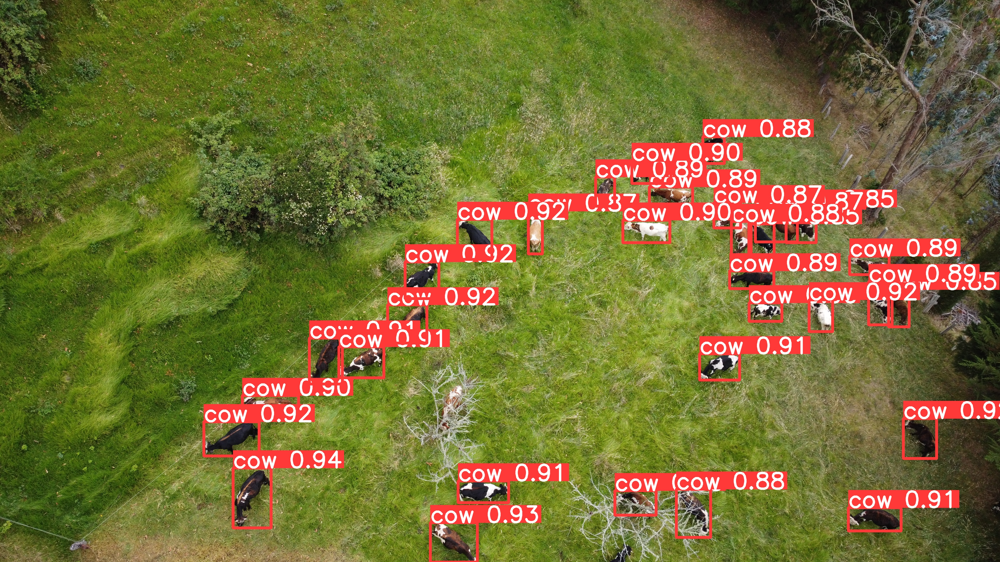

In [ ]:
from IPython.display import Image, display

# Image path
path_img = "/content/runs/detect/predict/0f7884e5-0bc7-4698-bb09-a0406daa33b7.JPG"

# Mostrar la imagen
display(Image(filename=path_img, height= 700))


In [ ]:
!yolo task=detect mode=predict model= /content/runs/detect/train/weights/best.pt conf=0.5 source='/DJI_0790.JPG'

Ultralytics YOLOv8.1.8 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /DJI_0790.JPG: 480x640 11 cows, 85.5ms
Speed: 4.1ms preprocess, 85.5ms inference, 493.0ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict7
💡 Learn more at https://docs.ultralytics.com/modes/predict


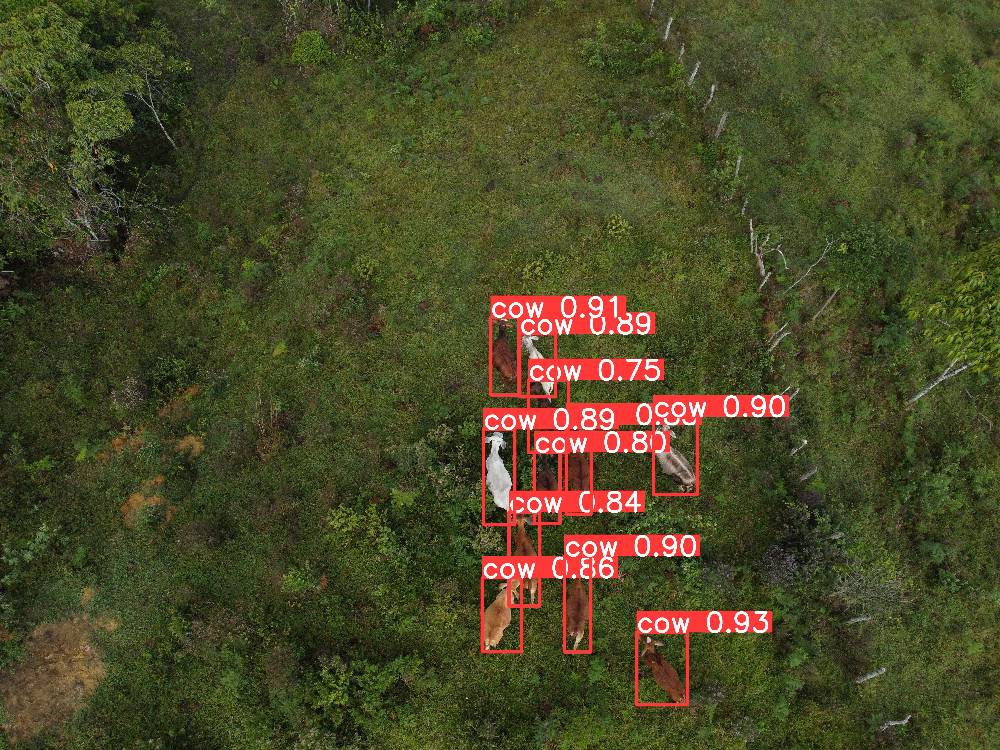

In [ ]:
display(Image(filename="/content/runs/detect/predict7/DJI_0790.JPG", height= 700))